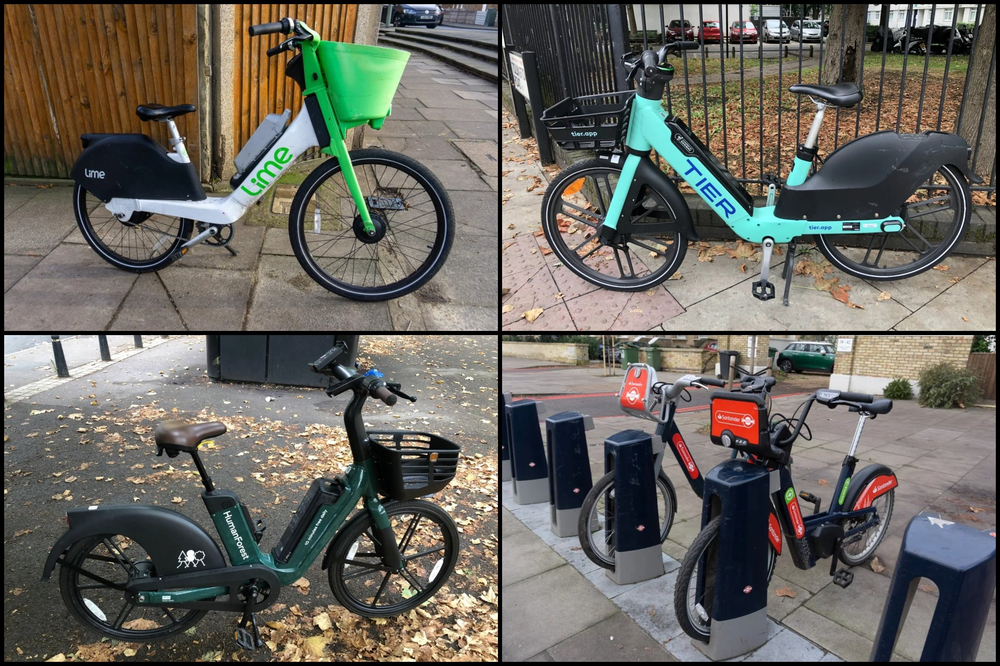

<div class="alert alert-block alert-info alert">

# <span style=" color:red">WELCOME!
    
Welcome to "Bike Demand Visualization Project" which is the capstone project of Data Visualization Lessons . As you know recently, free or affordable access to bicycles has been provided for short-distance trips in an urban area as an alternative to motorized public transport or private vehicles. Thus, it is aimed to reduce traffic congestion, noise and air pollution.

The aim of this project is to reveal the current patterns in the data by showing the historical data of London bike shares with visualization tools.

This will allow us to X-ray the data as part of the EDA process before setting up a machine learning model.</span>


<div class="alert alert-block alert-success ">

## <span style=" color:red">Determines 
    
Features 
    
- timestamp - timestamp field for grouping the data
- cnt - the count of a new bike shares
- t1 - real temperature in C
- t2 - temperature in C “feels like”
- hum - humidity in percentage
- wind_speed - wind speed in km/h
- weather_code - category of the weather
- is_holiday - boolean field - 1 holiday / 0 non holiday
- is_weekend - boolean field - 1 if the day is weekend
- season - category field meteorological seasons: 0-spring ; 1-summer; 2-fall; 3-winter.
    
"weather_code" category description:

- 1 = Clear ; mostly clear but have some values with haze/fog/patches of fog/ fog in vicinity
- 2 = scattered clouds / few clouds
- 3 = Broken clouds
- 4 = Cloudy
- 7 = Rain/ light Rain shower/ Light rain
- 10 = rain with thunderstorm
- 26 = snowfall
- 94 = Freezing Fog
    
Initially, the task of discovering data will be waiting for you as always. Recognize features, detect missing values, outliers etc. Review the data from various angles in different time breakdowns. For example, visualize the distribution of bike shares by day of the week. With this graph, you will be able to easily observe and make inferences how people's behavior changes daily. Likewise, you can make hourly, monthly, seasonally etc. analyzes. In addition, you can analyze correlation of variables with a heatmap.
    
# <span style=" color:red">Tasks
</span>





<div class="alert alert-warning alert-info">
<span style=" color:red">1. Import Libraries
</span>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
from pylab import rcParams

import warnings
warnings.filterwarnings("ignore") 

<div class="alert alert-warning alert-info">
<span style=" color:red">2. Read Dataset
</span>

In [2]:
df = pd.read_csv("store_sharing.csv")
df.head(20)

,timestamp,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0
5,2015-01-04 05:00:00,46,2.0,2.0,93.0,4.0,1.0,0.0,1.0,3.0
6,2015-01-04 06:00:00,51,1.0,-1.0,100.0,7.0,4.0,0.0,1.0,3.0
7,2015-01-04 07:00:00,75,1.0,-1.0,100.0,7.0,4.0,0.0,1.0,3.0
8,2015-01-04 08:00:00,131,1.5,-1.0,96.5,8.0,4.0,0.0,1.0,3.0
9,2015-01-04 09:00:00,301,2.0,-0.5,100.0,9.0,3.0,0.0,1.0,3.0


<div class="alert alert-warning alert-info">
<span style=" color:red">3. Check missing values and if there are any dublicate rows or not.
</span>

In [ ]:
df.info()

In [ ]:
df.isna().sum() 

In [ ]:
df.duplicated().value_counts() 

In [ ]:
df.shape

In [ ]:
# There is no missing values. 

In [ ]:
df.duplicated().sum() 

In [ ]:
df[df.duplicated()] 

In [ ]:
# There is no duplicated rows. 

<div class="alert alert-warning alert-info">
<span style=" color:red">4. Plot the distribution of various discrete features on (Season, holiday, weekend and weathercode)
</span>


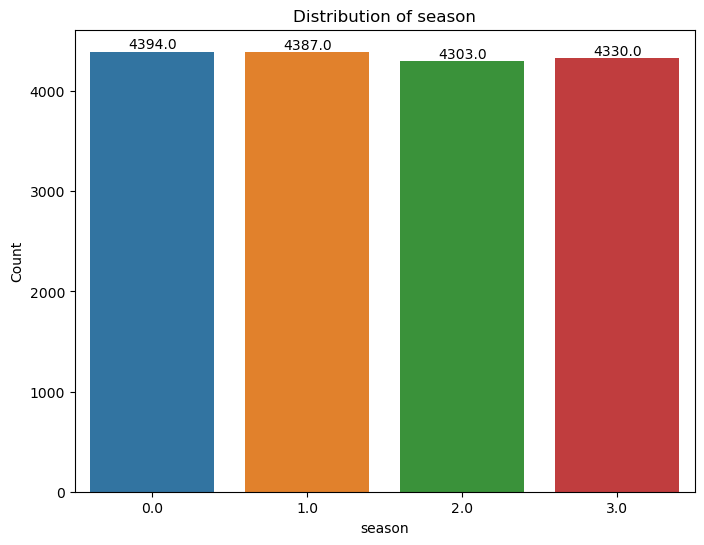

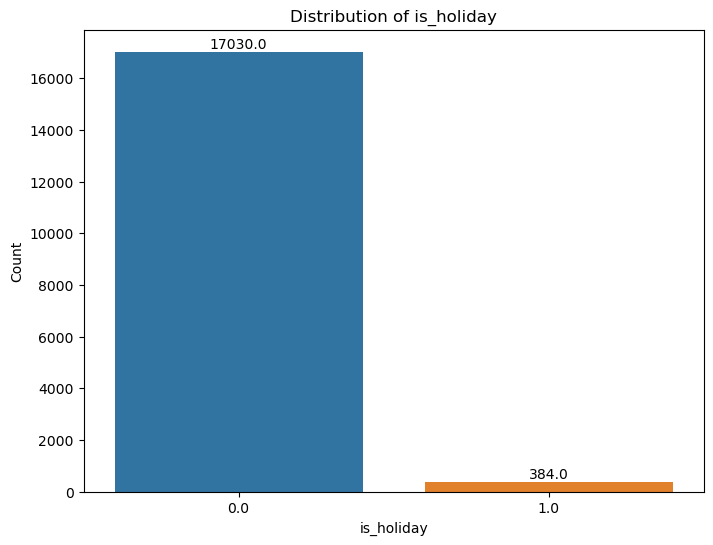

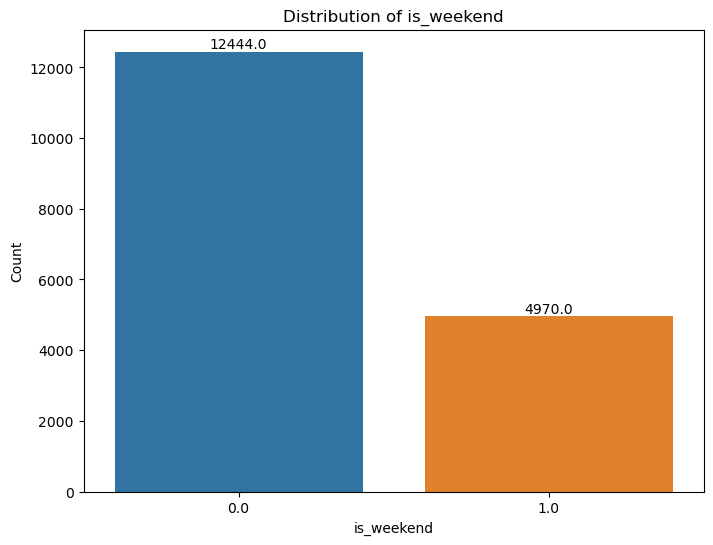

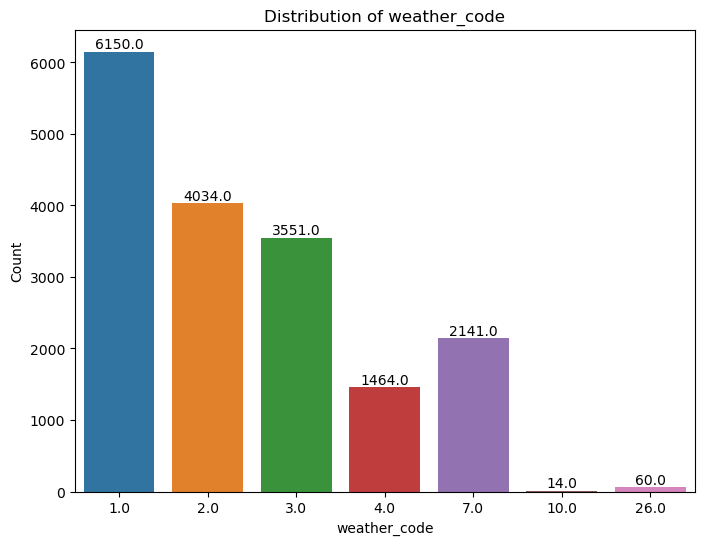

In [3]:
columns = ['season', 'is_holiday', 'is_weekend', 'weather_code']

# Plotting the distribution of discrete features
for column in columns:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=column, data=df)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Count")
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 5), textcoords='offset points');

# weather_code
sns.countplot(x='weather_code',data=df)

1 = Clear ; mostly clear but have some values with haze/fog/patches of fog/ fog in vicinity
2 = scattered clouds / few clouds
3 = Broken clouds
4 = Cloudy
7 = Rain/ light Rain shower/ Light rain
10 = rain with thunderstorm
26 = snowfall
94 = Freezing Fog

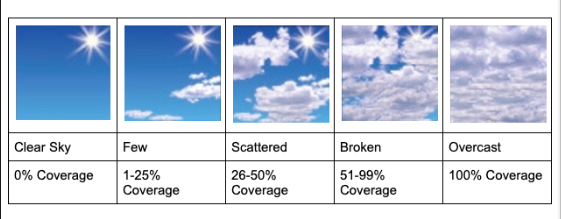

<div class="alert alert-warning alert-info">
<span style=" color:red">5. Look at the data type of each variable, transform timestamp in type, and set it as index.
</span>

In [4]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17414 entries, 0 to 17413
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   timestamp     17414 non-null  object 
 1   cnt           17414 non-null  int64  
 2   t1            17414 non-null  float64
 3   t2            17414 non-null  float64
 4   hum           17414 non-null  float64
 5   wind_speed    17414 non-null  float64
 6   weather_code  17414 non-null  float64
 7   is_holiday    17414 non-null  float64
 8   is_weekend    17414 non-null  float64
 9   season        17414 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 1.3+ MB


In [5]:
df["timestamp"] = pd.to_datetime(df["timestamp"])

In [6]:
df = df.set_index("timestamp") 
df.head(3) 

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
timestamp,,,,,,,,,
2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0
2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0
2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0


In [7]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17414 entries, 2015-01-04 00:00:00 to 2017-01-03 23:00:00
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   cnt           17414 non-null  int64  
 1   t1            17414 non-null  float64
 2   t2            17414 non-null  float64
 3   hum           17414 non-null  float64
 4   wind_speed    17414 non-null  float64
 5   weather_code  17414 non-null  float64
 6   is_holiday    17414 non-null  float64
 7   is_weekend    17414 non-null  float64
 8   season        17414 non-null  float64
dtypes: float64(8), int64(1)
memory usage: 1.3 MB


<div class="alert alert-warning alert-info">
<span style=" color:red">6. Make feature engineering. Extract new columns (day of the week, day of the month, hour, month, season, year etc.)
</span>

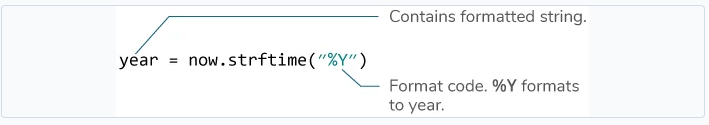

In [8]:
df["year_month"] = df.index.strftime('%Y-%m')
df["year"] = df.index.year
df["month"] = df.index.month
df["day_of_month"] = df.index.day
df["day_of_week"] = df.index.weekday
df["hour"] = df.index.hour
df.head()

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,year_month,year,month,day_of_month,day_of_week,hour
timestamp,,,,,,,,,,,,,,,
2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,2015-01,2015,1,4,6,0
2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,2015-01,2015,1,4,6,1
2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0,2015-01,2015,1,4,6,2
2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0,2015-01,2015,1,4,6,3
2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0,2015-01,2015,1,4,6,4


<div class="alert alert-warning alert-info">
<span style=" color:red">7. Visualize the correlation with a heatmap
</span>

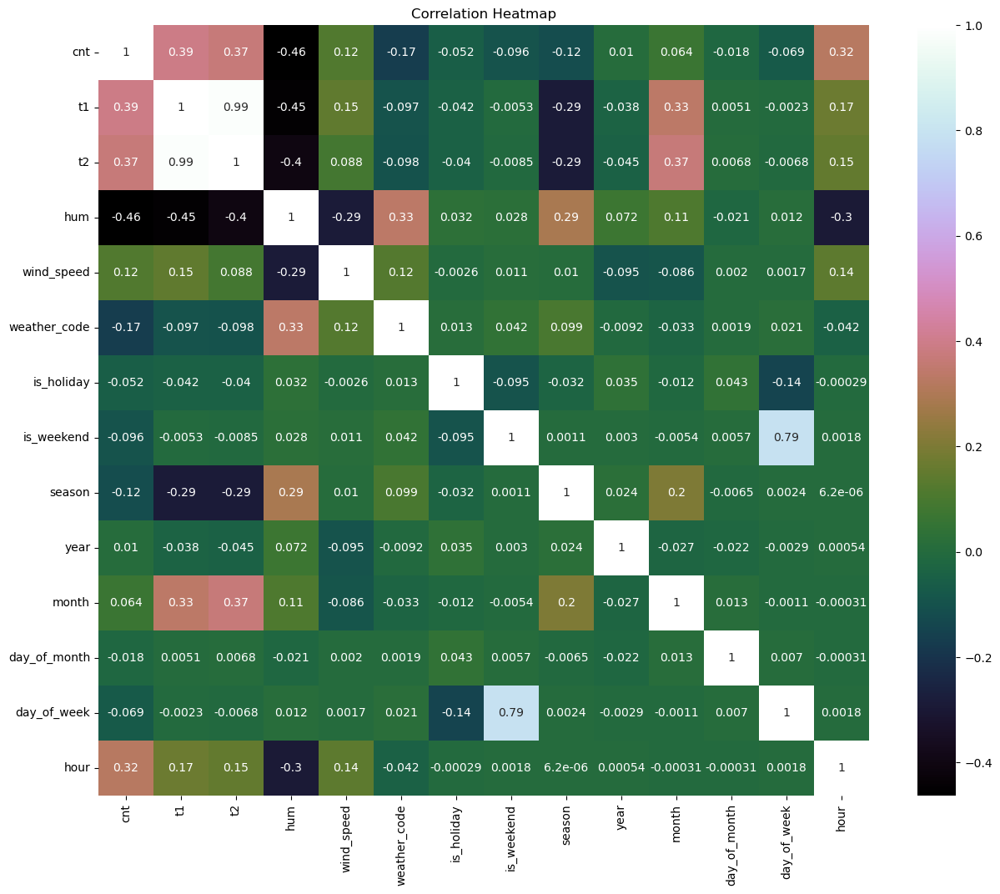

In [13]:
# Create a heatmap of the correlation matrix
plt.figure(figsize=(15, 12))
sns.heatmap(df.corr(), annot=True, cmap='cubehelix', square=True)
plt.title("Correlation Heatmap"); 

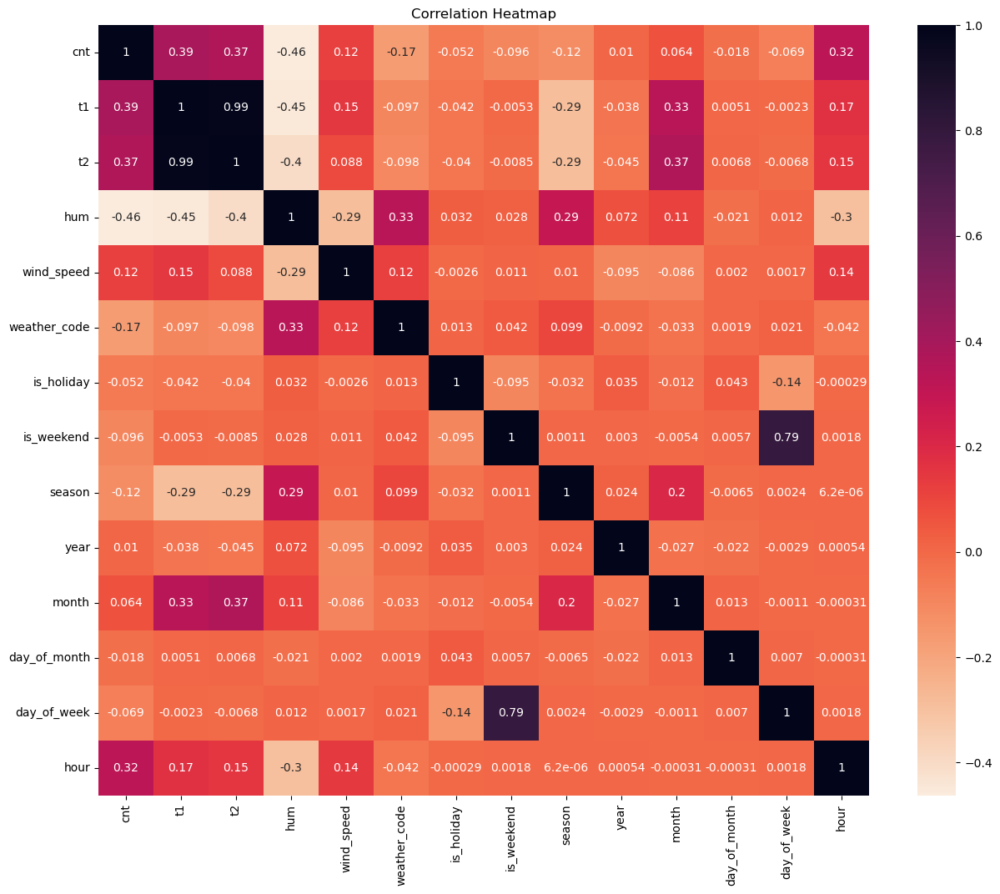

In [14]:
# Create a heatmap of the correlation matrix
plt.figure(figsize=(15, 12))
sns.heatmap(df.corr(), annot=True, cmap='rocket_r', square=True)
plt.title("Correlation Heatmap"); 

We understand that the count of a new bike shares(cnt) column has a positive correlation with t1, t2 and hour columns. Also hum column, which gives information about humidity in percentage, has a fairly high negative correlation with cnt. 

<div class="alert alert-warning alert-info">
<span style=" color:red">8. Visualize the correlation of the target variable and the other features with barplot
</span>

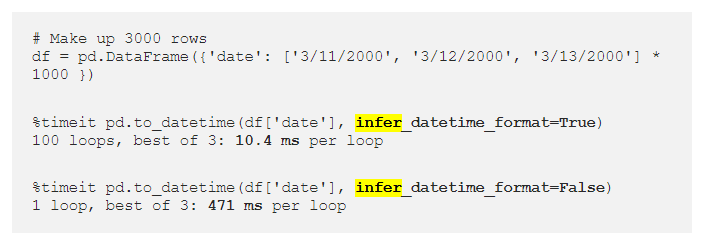

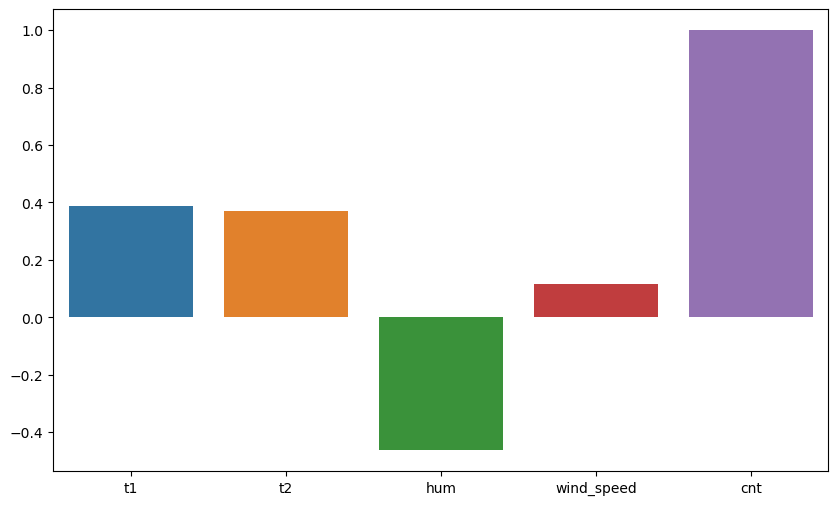

In [12]:
columns_of_interest = ['t1', 't2', 'hum', "wind_speed" ]

# Calculate the correlation with the 'cnt' column
correlation = df[columns_of_interest + ['cnt']].corr()['cnt']

# Plot the correlation values as a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation.index, y=correlation.values);

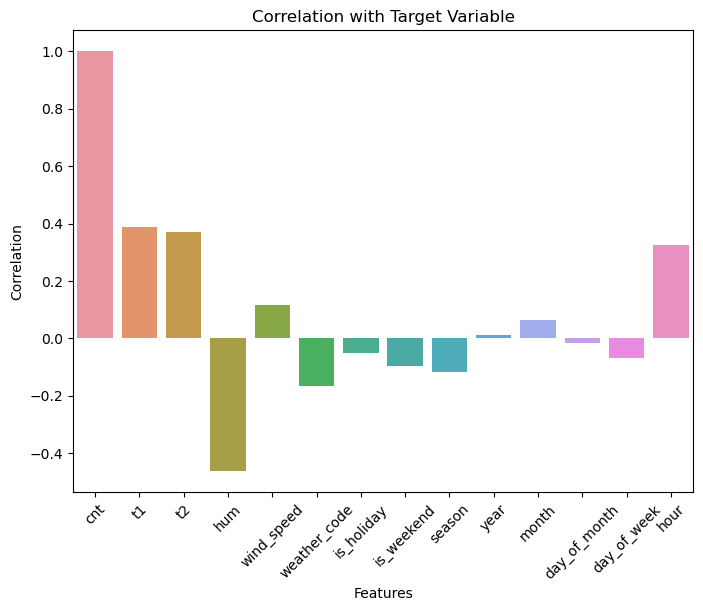

In [15]:
correlations = df.corr()['cnt']

# Create bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=correlations.index, y=correlations.values) 
plt.title("Correlation with Target Variable")
plt.xlabel("Features")
plt.ylabel("Correlation")
plt.xticks(rotation=45); 

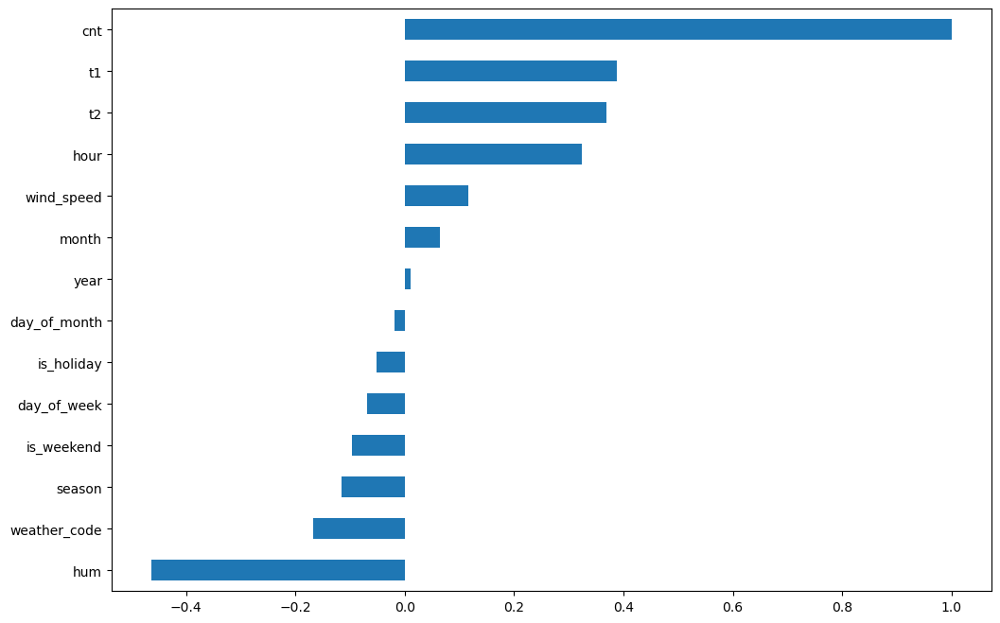

In [24]:
plt.figure(figsize=(12,8))
df.corr()["cnt"].sort_values().plot(kind="barh"); 

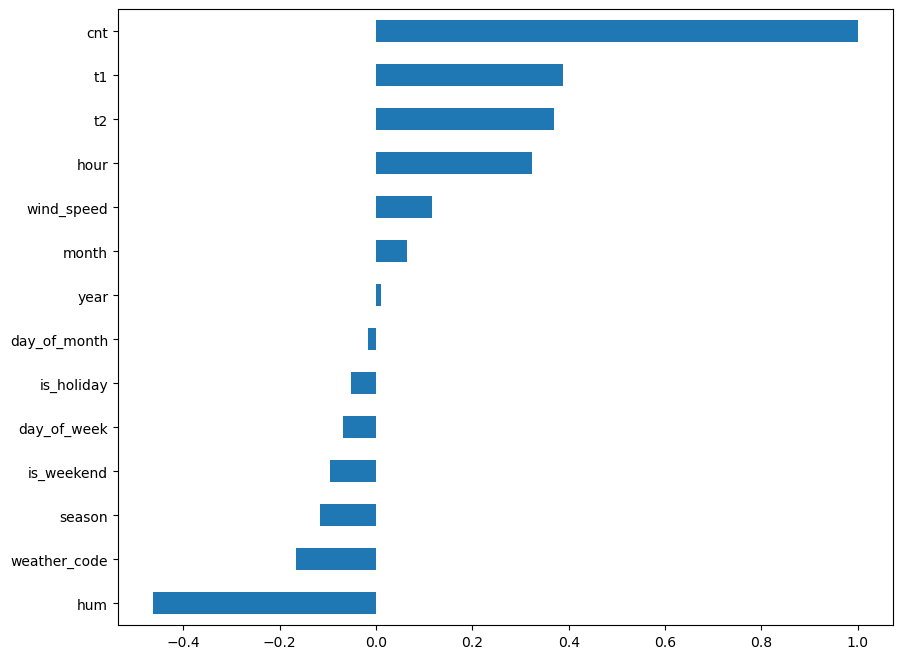

In [22]:
plt.figure(figsize=(10,8))
df.corr()["cnt"].sort_values().plot.barh();

<div class="alert alert-warning alert-info">
<span style=" color:red">9. Plot bike shares over time use lineplot.
</span>

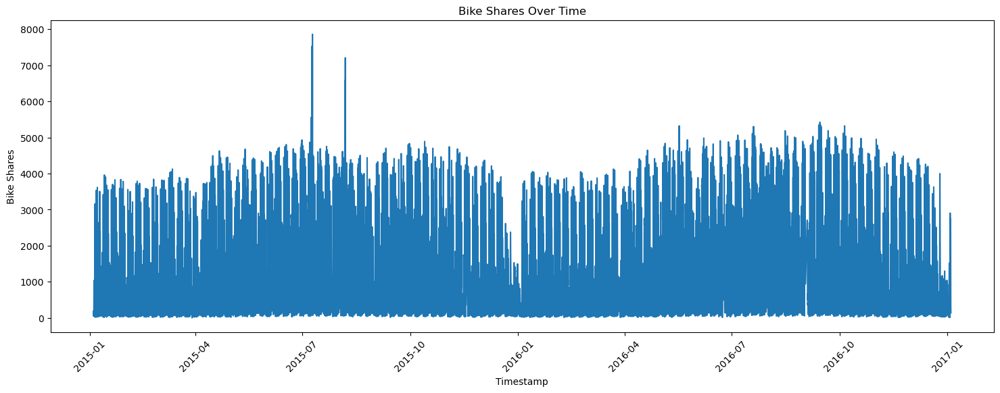

In [25]:
# Plot bike shares over time using Seaborn
plt.figure(figsize=(18, 6))
sns.lineplot(x='timestamp', y='cnt', data=df)
plt.title('Bike Shares Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Bike Shares')
plt.xticks(rotation=45)
plt.show() 

In [26]:
# As  we can see in the chart above, there are two outliars dates. 
# When we look for cnt data more than 6000, we see that these dates are 2015-07-09 and 2015-08-06.
# If we look for these dates, we may come across with some kind of promotion campaign or big discounts. 

df[df["cnt"]>6000] 

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,year_month,year,month,day_of_month,day_of_week,hour
timestamp,,,,,,,,,,,,,,,
2015-07-09 08:00:00,7531,14.5,14.5,61.0,19.0,2.0,0.0,0.0,1.0,2015-07,2015,7,9,3,8
2015-07-09 16:00:00,6033,23.0,22.0,26.0,11.0,1.0,0.0,0.0,1.0,2015-07,2015,7,9,3,16
2015-07-09 17:00:00,7860,23.0,22.0,27.0,11.0,1.0,0.0,0.0,1.0,2015-07,2015,7,9,3,17
2015-07-09 18:00:00,6913,22.5,21.5,29.0,13.0,1.0,0.0,0.0,1.0,2015-07,2015,7,9,3,18
2015-08-06 08:00:00,6585,19.0,19.0,78.0,12.0,7.0,0.0,0.0,1.0,2015-08,2015,8,6,3,8
2015-08-06 17:00:00,7208,22.5,22.5,55.0,17.5,2.0,0.0,0.0,1.0,2015-08,2015,8,6,3,17
2015-08-06 18:00:00,6394,21.5,21.5,58.5,20.0,2.0,0.0,0.0,1.0,2015-08,2015,8,6,3,18


<div class="alert alert-warning alert-info">
<span style=" color:red">10. Plot bike shares by months and month_of_year (X year_of_month X) (use lineplot, pointplot, barplot).
</span>



In [27]:
# Creating a subset with cnt and year_month columns cnt being grouped by months. 
cnt_year_month = df.groupby('year_month')['cnt'].sum().reset_index()
cnt_year_month  

,year_month,cnt
0,2015-01,546639
1,2015-02,543594
2,2015-03,695934
3,2015-04,831582
4,2015-05,895413
5,2015-06,1033252
6,2015-07,1120687
7,2015-08,1033951
8,2015-09,892478
9,2015-10,865046


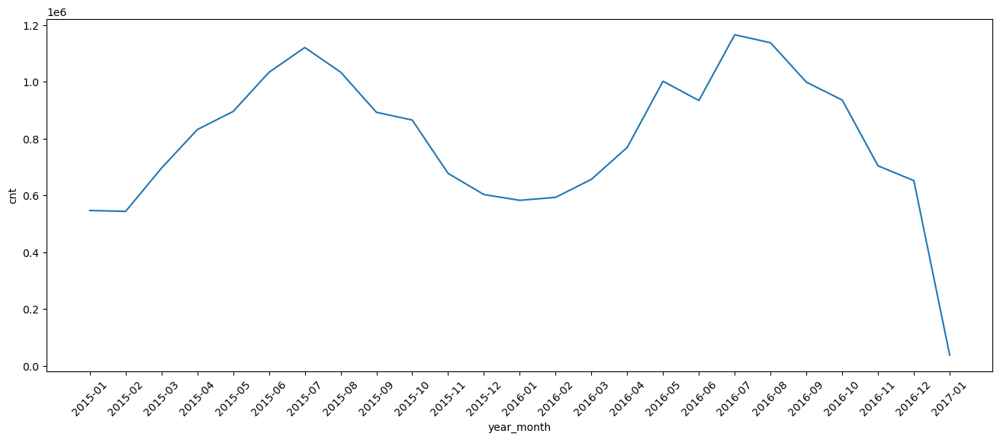

In [28]:
plt.figure(figsize=(16,6))
sns.lineplot(x="year_month", y="cnt", data=cnt_year_month)
plt.xticks(rotation=45);

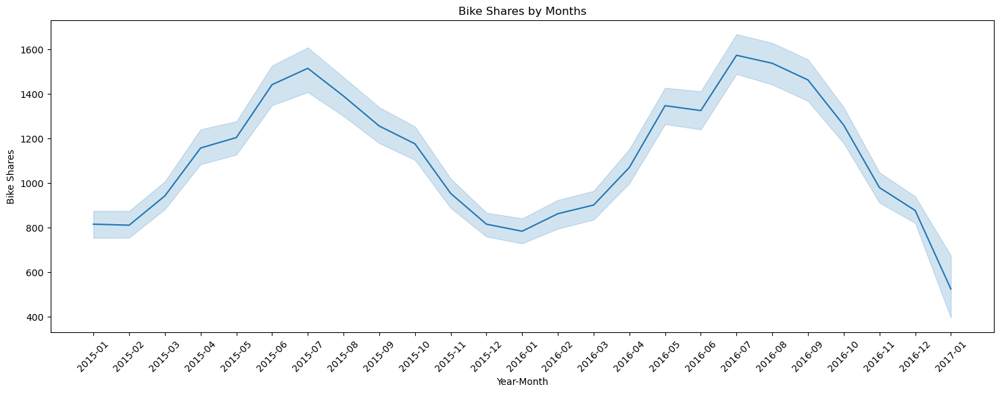

In [29]:
# Plot bike shares by year_month
plt.figure(figsize=(18, 6)) 
sns.lineplot(data=df, x='year_month', y='cnt') 
plt.xlabel('Year-Month')
plt.ylabel('Bike Shares')
plt.title('Bike Shares by Months')
plt.xticks(rotation=45);

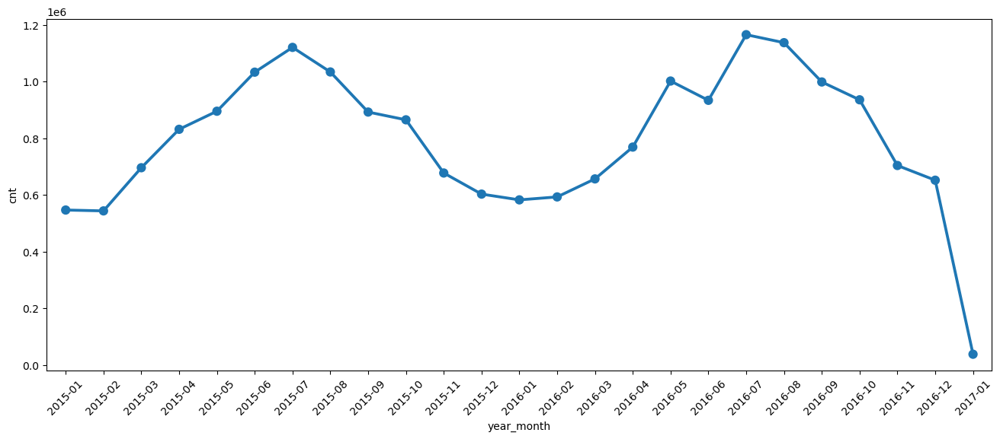

In [30]:
# We can see the same thing with points in each data point. 
plt.figure(figsize=(16,6))
sns.pointplot(x="year_month", y="cnt", data=cnt_year_month)
plt.xticks(rotation=45);

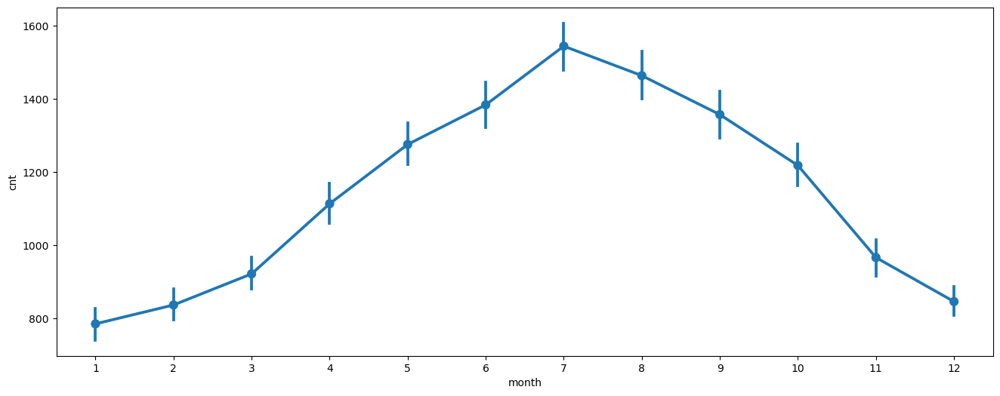

In [31]:
# We can use month column to see an average yearly graph. 
plt.figure(figsize=(16,6))
sns.pointplot(x="month", y="cnt", data=df);

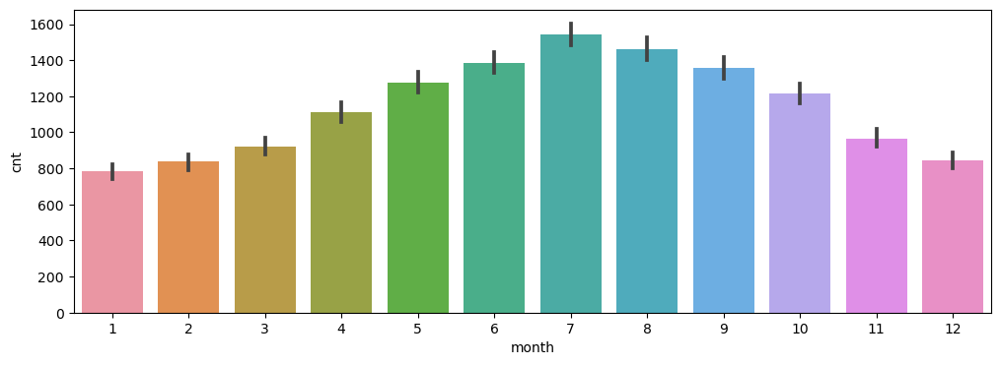

In [32]:
plt.figure(figsize=(12,4)) 
sns.barplot(x="month", y="cnt", data=df);

The last two plots show us the cnt difference by months. We can say that bike share increases in summer. 

<div class="alert alert-warning alert-info">
<span style=" color:red">11. Plot bike shares by hours on (holidays, weekend, season).
</span>

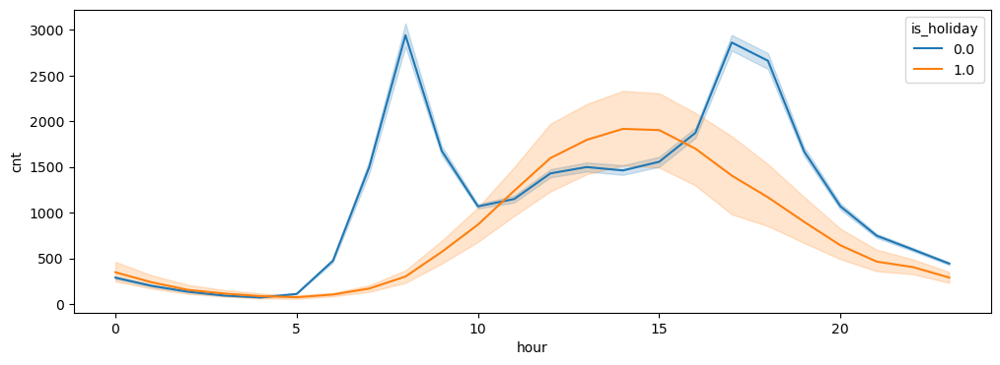

In [33]:
plt.figure(figsize=(12,4)) 
sns.lineplot(data=df, x="hour", y="cnt", hue="is_holiday"); 

We can see that there is a very clear difference between holiday pattern and during the week. 
In weekdays, bike shares increase around 8AM and 5PM.
This probably means that people use bikes when going to work and returning home. 

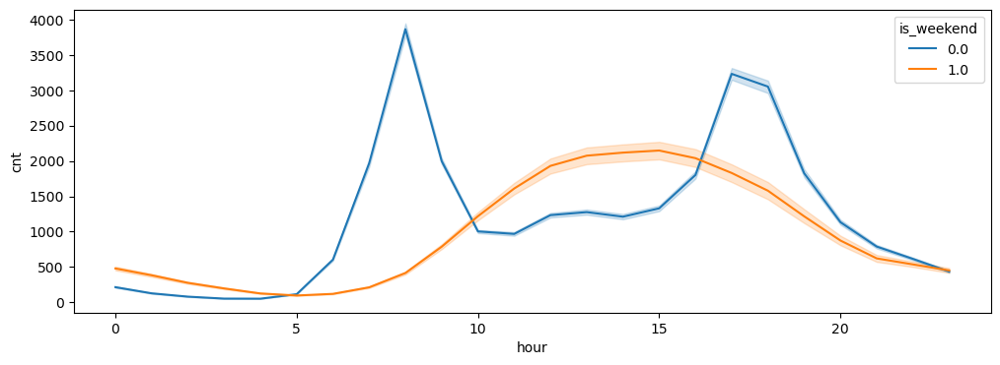

In [34]:
plt.figure(figsize=(12,4)) 
sns.lineplot(data=df, x="hour", y="cnt", hue="is_weekend");  

In [35]:
# When plotting bike shares by hours on season I want to see the actual season names in the legent instead of numbers. 

season_mapping = {0.0: 'Spring', 1.0: 'Summer', 2.0: 'Autumn', 3.0: 'Winter'}
df['season_name'] = df['season'].replace(season_mapping)

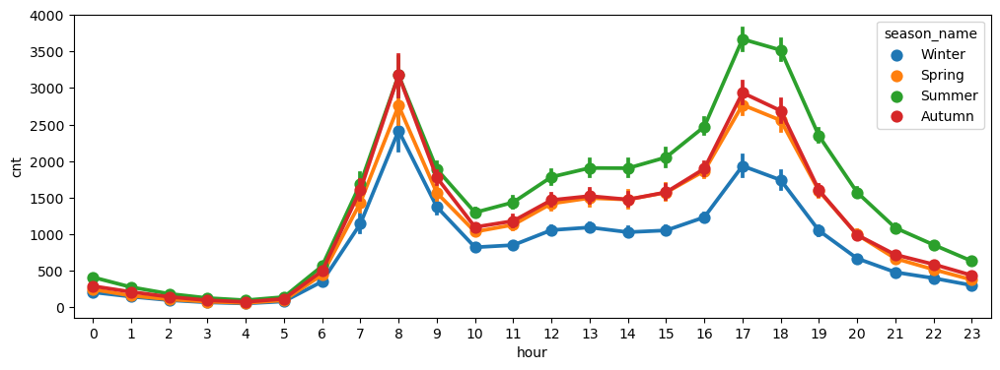

In [36]:
plt.figure(figsize=(12,4))
sns.pointplot(data=df, x="hour", y="cnt", hue="season_name");

The plot clearly indicates that the summer season has the highest bike usage.

Now, let's see all these graphs together.  

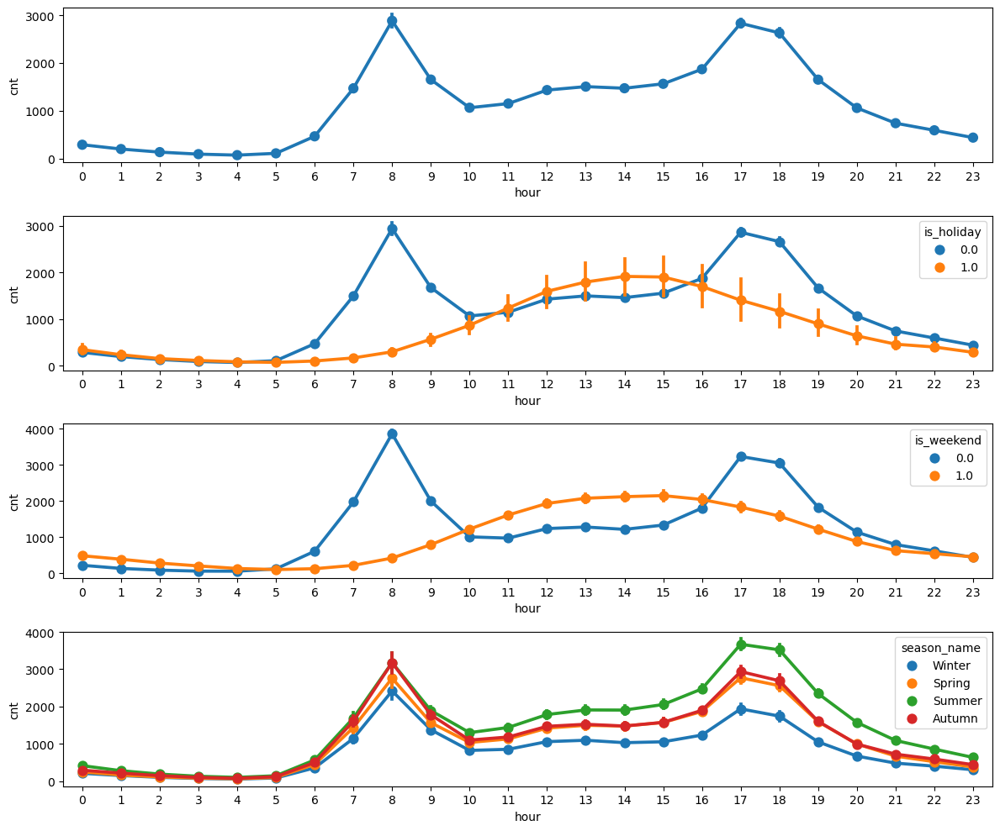

In [37]:
fig, axs = plt.subplots(nrows=4,ncols=1,figsize=(12,10)) 
sns.pointplot(data=dcnt", ax=axf, x="hour", y="s[0])
sns.pointplot(data=df, x="hour", y="cnt", ax=axs[1], hue="is_holiday")
sns.pointplot(data=df, x="hour", y="cnt", ax=axs[2], hue="is_weekend")
sns.pointplot(data=df, x="hour", y="cnt", ax=axs[3], hue="season_name")
plt.tight_layout(); 

<div class="alert alert-warning alert-info">
<span style=" color:red"> 12. Plot bike shares by day of week.

- You may want to see whether it is a holiday or not
</span>

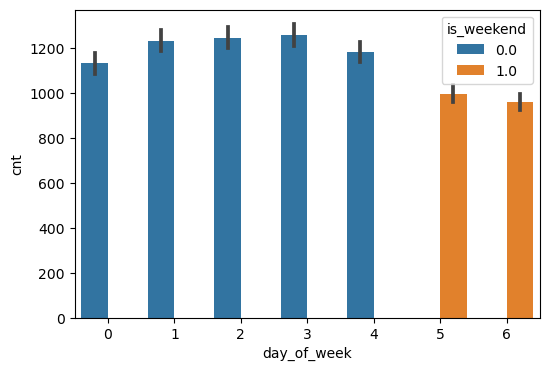

In [38]:
plt.figure(figsize=(6,4)) 
sns.barplot(x="day_of_week", y="cnt", data=df, hue="is_weekend");

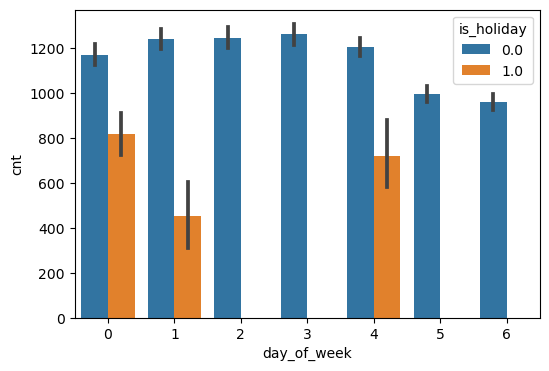

In [39]:
plt.figure(figsize=(6,4)) 
sns.barplot(x="day_of_week", y="cnt", data=df, hue="is_holiday");

In [40]:
plt.figure(figsize=(6,4)) 
sns.barplot(x="day_of_week", y="cnt", data=df, hue="weekday");

ValueError: Could not interpret input 'weekday'

<Figure size 600x400 with 0 Axes>

People use bike in weekdays more than weekends.

<div class="alert alert-warning alert-info">
<span style=" color:red"> 13. Plot bike shares by day of month
</span>

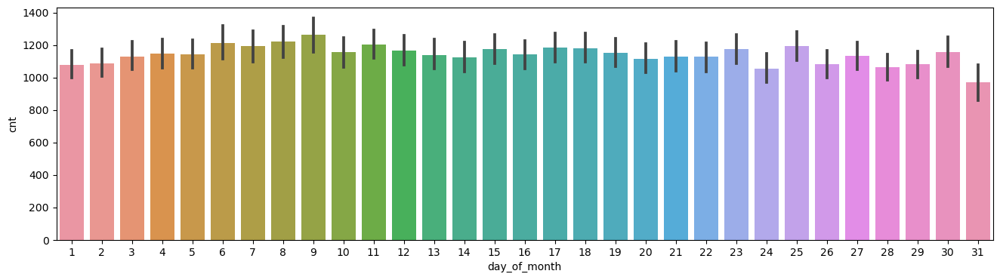

In [41]:
plt.figure(figsize=(16,4))
sns.barplot(data=df, x="day_of_month", y="cnt");

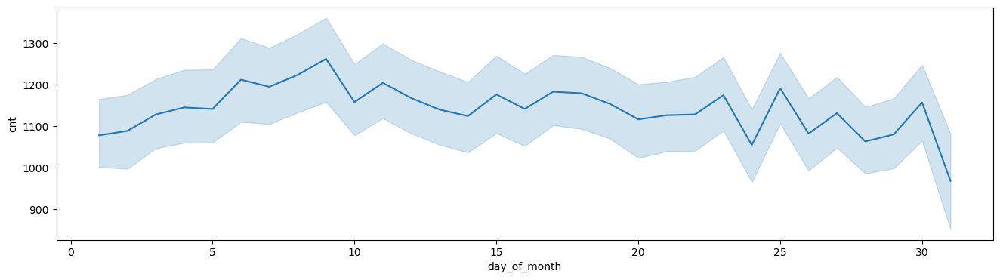

In [42]:
plt.figure(figsize=(16,4))
sns.lineplot(data=df, x="day_of_month", y="cnt");

<div class="alert alert-warning alert-info">
<span style=" color:red"> 14. Plot bike shares by year

- Plot bike shares on holidays by seasons
</span>

In [55]:
df[df['year'] == 2015]['cnt'].mean() 

1126.7784334143237

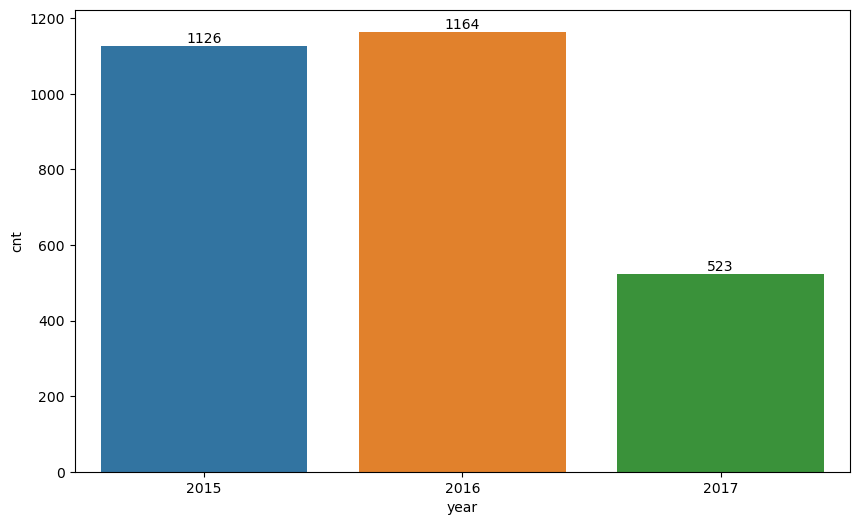

In [54]:
# Plotting bike shares by year

plt.figure(figsize=(10,6))
ax = sns.barplot(data=df, x="year",y="cnt", errorbar=None) 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height, int(height), ha='center', va='bottom'); 

This graph shows a slight increase from 2015 to 2016 and a sharp decrease in the average use of bike in 2017. It is because we have the data of only three days from the beginning of 2017. And 3 three days of data can't represent the whole year.  

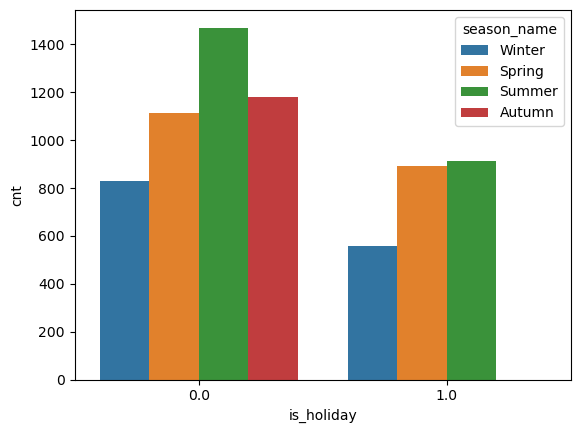

In [58]:
plt.figure()
sns.barplot(x="is_holiday", y="cnt", data=df, hue = "season_name", errorbar=None);

Holidays in the winter sees the least usage of bikes. 

<div class="alert alert-warning alert-info">
<span style=" color:red">15. Visualize the distribution of bike shares by weekday/weekend with piechart and barplot
</span>

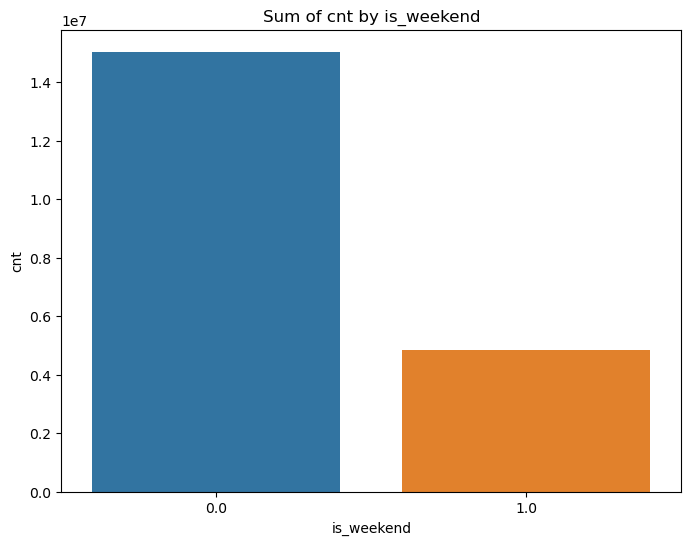

In [65]:
plt.figure(figsize=(8, 6))
sns.barplot(data=df, x='is_weekend', y='cnt', estimator=sum, errorbar=None)
plt.title('Sum of cnt by is_weekend');

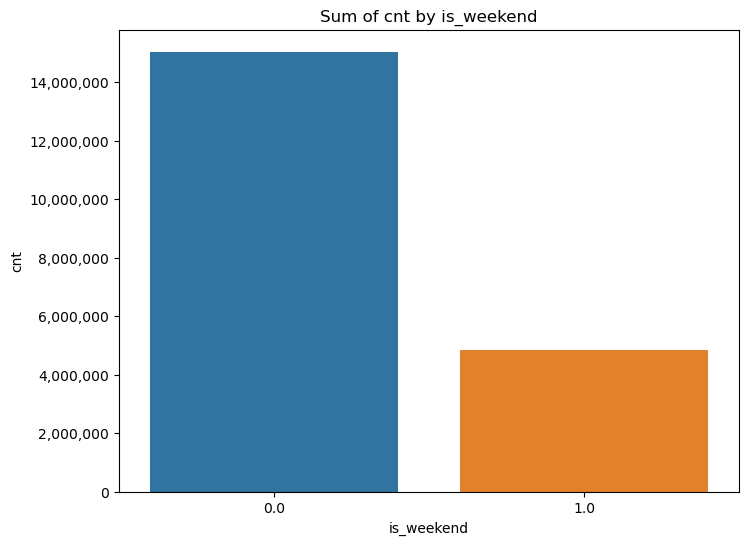

In [64]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df, x='is_weekend', y='cnt', estimator=sum, errorbar=None)
plt.title('Sum of cnt by is_weekend')

y_ticks = ax.get_yticks()

ax.set_yticklabels([f'{int(tick):,}' for tick in y_ticks]);

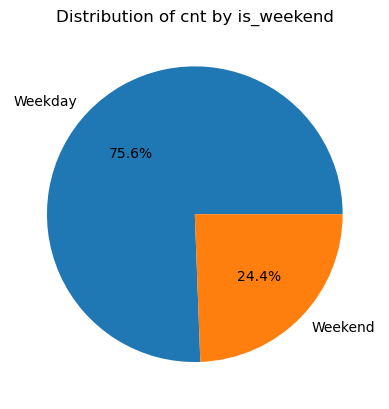

In [63]:
sum_by_weekend = df.groupby('is_weekend')['cnt'].sum()

plt.pie(sum_by_weekend.values, labels=["Weekday","Weekend"], autopct='%1.1f%%')
plt.title('Distribution of cnt by is_weekend');

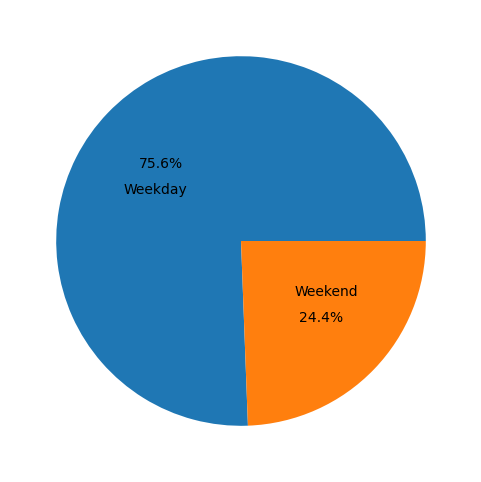

In [62]:
fig, ax = plt.subplots(figsize=(6,6))

ax.pie(df.groupby('is_weekend')['cnt'].sum(),
      labels=["Weekday","Weekend"],
      labeldistance=0.4,
      autopct="%.1f%%");

Examining the total of bike shares for weekdays and weekends does not provide sufficient insight into the actual occurrence frequency of bike sharing. Alter all, weekdays consist of five days, while weekends only comprise two days. That's way we should examine the average usage for weekends and weekdays. 

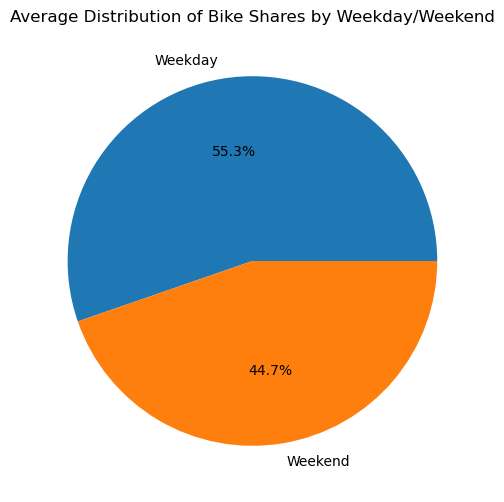

In [67]:
is_weekend_group = df.groupby('is_weekend')['cnt'].mean()

plt.figure(figsize=(6, 6))
plt.pie(df.groupby('is_weekend')['cnt'].mean(), labels=["Weekday","Weekend"], autopct='%1.1f%%')
plt.title('Average Distribution of Bike Shares by Weekday/Weekend');

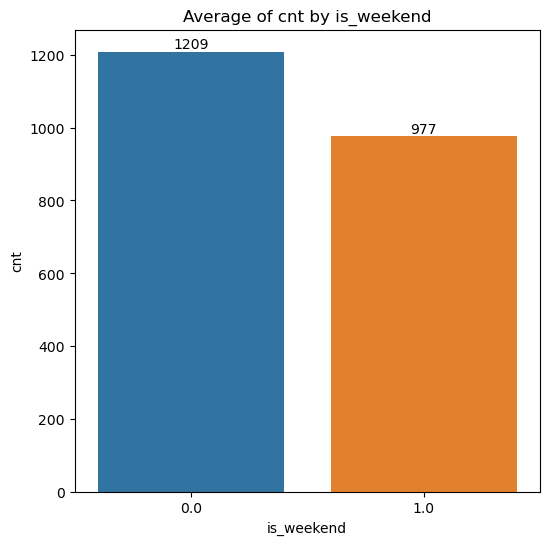

In [73]:
plt.figure(figsize=(6, 6))
ax = sns.barplot(data=df, x='is_weekend', y='cnt', estimator="mean", errorbar=None)
plt.title('Average of cnt by is_weekend'); 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height, int(height), ha='center', va='bottom'); 

In [69]:
df[df['is_weekend'] == 1.0]['cnt'].mean()

977.41569416499

In [70]:
df[df['is_weekend'] == 0.0]['cnt'].mean()

1209.274831243973

In [71]:
df[df['is_weekend'] == 1.0]['cnt'].sum()

4857756

After seeing the charts above, we may conclude that weekdays have almost %10 more bike usage than weekends. But if we think a bit more detailed, these charts actually handle holidays as weekdays. So we can create a new column called "working_day" to see the actual pattern of working and non-working days whether they are holidays or weekends.    

In [74]:
df['working_day'] = (~df['is_weekend'].astype(bool) & ~df['is_holiday'].astype(bool)).astype(int)
df.head(1) 

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,year_month,year,month,day_of_month,day_of_week,hour,season_name,working_day
timestamp,,,,,,,,,,,,,,,,,
2015-01-04,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,2015-01,2015,1,4,6,0,Winter,0


In [75]:
df.working_day.value_counts()

1    12060
0     5354
Name: working_day, dtype: int64

In [76]:
df[df.is_holiday == 1.0]["is_holiday"].value_counts() + df[df.is_weekend ==1.0]["is_weekend"].value_counts()  

1.0    5354
dtype: int64

Now we can see the actual percentage of bike usage in working days. 

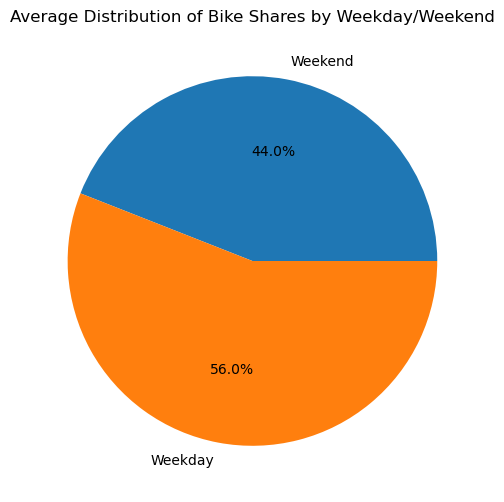

In [78]:
plt.figure(figsize=(6, 6))
plt.pie(df.groupby('working_day')['cnt'].mean(), labels=["Weekend","Weekday"], autopct='%1.1f%%')
plt.title('Average Distribution of Bike Shares by Weekday/Weekend');

In [ ]:
Hehe! Now the difference is %12. 

<div class="alert alert-warning alert-info">
<span style=" color:red">16. Plot the distribution of weather code by seasons
</span>

In [ ]:
1 = Clear ; mostly clear but have some values with haze/fog/patches of fog/ fog in vicinity
2 = scattered clouds / few clouds
3 = Broken clouds
4 = Cloudy
7 = Rain/ light Rain shower/ Light rain
10 = rain with thunderstorm
26 = snowfall
94 = Freezing Fog

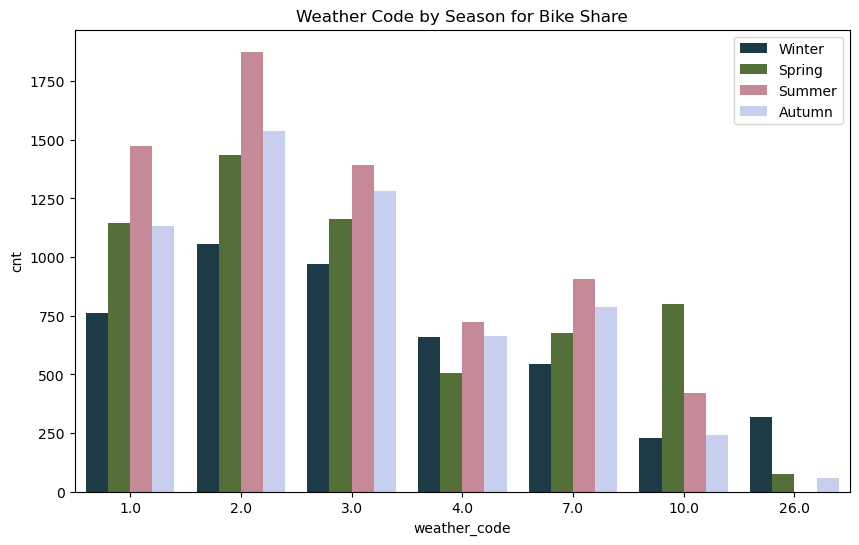

In [90]:
fig,plt.subplots(figsize=(10,6))
sns.barplot(df,x="weather_code",y="cnt",hue="season_name",palette="cubehelix", ci=False) 
plt.title("Weather Code by Season for Bike Share")
plt.legend(loc="upper right"); 

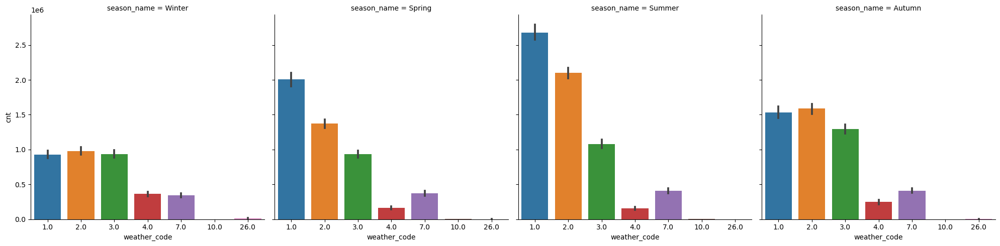

In [79]:
sns.catplot(data=df,x="weather_code", y="cnt", col="season_name", kind="bar", estimator="sum"); 

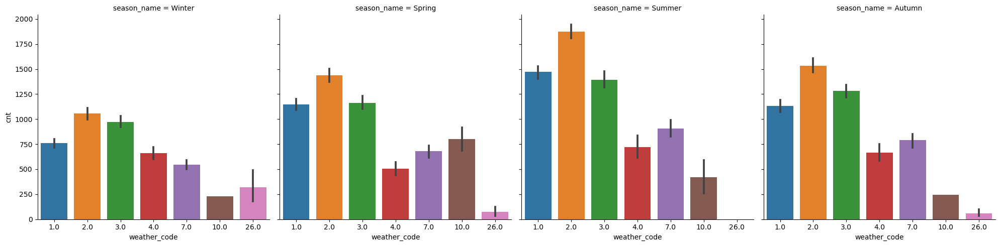

In [80]:
sns.catplot(data=df,x="weather_code", y="cnt", col="season_name", kind="bar", estimator="mean"); 

<div class="alert alert-info alert-info ">

# <span style=" color:red">Conclusions
    

    

</span>

More bikes have been rented on weekdays compared to the weekends. 

During the working days, people tend to hire bikes at the rush hours, probably going to work and on the way back. 

The month grouping shows clear seasonality, with summer months having a higher number of rented bikes.

Recommendations

Months like Dec, Jan and Feb sees less amount of bookings. To increase it, we can promote a campaign or provide a discount on the booking to attract more customers.

It is important to make sure there are enough bicycles on the roads at peak times, more specifically, in the residential areas during the morning peak, and in business neighborhoods during the afternoon peak. 

More users are booking bikes when humidity is less so we can provide an offer to add a refreshment during humid weather. 

Working days sees more bookings so we can provide an offer during weekends or holidays to bring in more bookings. 
 
We can put less bikes on the roads during the periods which has less bike hires to avoid maintenance cost.   

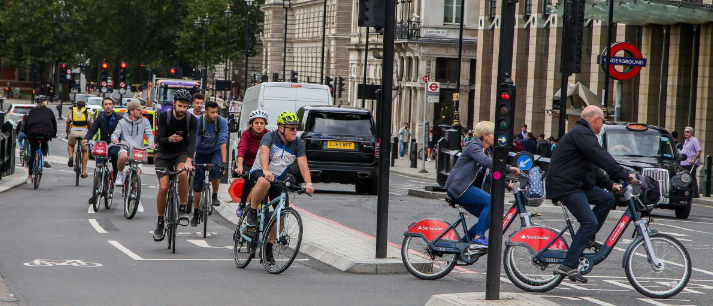